# Neural style transfer

"Neural Style Transfer" (Sinirsel Stil Aktarımı), aslında bir resim oluşturma sanatıdır ve derin öğrenmeyi kullanır. Kısaca, bir görüntü alır ve başka bir görüntünün tarzını ona uygular. Yani, bir fotoğrafınızı alıp, sanki Picasso veya Van Gogh tarafından çizilmiş gibi görünmesini sağlar. Bu eğlenceli ve ilginç bir teknoloji ve bu alanda yapılan ilk çalışmalar "A Neural Algorithm of Artistic Style (Gatys et al.)" başlıklı makalede anlatılmıştır.

Bu algoritma, görüntünün içeriğini belirli bir tarza, yani başka bir görüntünün tarzına uyacak şekilde düzenler. Ancak bu süreç biraz zaman alabilir. Daha yeni yaklaşımlar, stilize edilmiş görüntüyü doğrudan oluşturacak bir model eğitir, bu da işlemleri daha hızlı hale getirir - bazen eski yöntemden 1000 kat daha hızlı!

TensorFlow Hub'da, önceden eğitilmiş bir modelle hızlı stil aktarımının nasıl yapılacağını gösteren bir öğretici bulabilirsiniz. Ayrıca TensorFlow Lite kullanılarak tarz aktarımının nasıl yapıldığına dair örnekler de bulunmaktadır.

Stil aktarımı, bir içerik görüntüsü ve bir stil referans görüntüsü (örneğin, ünlü bir ressamın sanat eseri) alır ve ikisini birleştirir. Sonuç olarak elde edilen görüntü, içerik görüntüsüne benzer, ancak stil referans görüntüsünün tarzında "resmedilmiş" olarak görünür. Bu, görüntüyü, içerik görüntüsünün içerik istatistiklerine ve stil referans görüntüsünün stil istatistiklerine uyacak şekilde optimize etmekle gerçekleştirilir. Bu istatistikler, görüntülerden bir evrişimli ağ (CNN) kullanılarak çıkarılır.

In [ ]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [ ]:
import IPython.display as display

import matplotlib.pyplot as plt

import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [ ]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

In [ ]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Download images and choose a style image and a content image:

In [ ]:
#Web üzerinden görsel kullanmak için
content_path = tf.keras.utils.get_file('murat.png', 'https://altunmurat.files.wordpress.com/2019/09/fotovesikalc4b1k2.png')
style_path = tf.keras.utils.get_file('stil.png', 'https://upload.wikimedia.org/wikipedia/commons/thumb/b/b3/Angular_Cubism_by_David_S._Soriano.png/849px-Angular_Cubism_by_David_S._Soriano.png?20230220200132')


967565/967565 [==============================] - 1s 1us/step


In [ ]:
#Colab veya lokal sistemden görsel kullanmak için
content_path = '/content/drive/MyDrive/YSAveDO/stil_transfer_image/gorsel.png'
style_path = ['/content/drive/MyDrive/YSAveDO/stil_transfer_image/style1.png',
              '/content/drive/MyDrive/YSAveDO/stil_transfer_image/style2.png',
              '/content/drive/MyDrive/YSAveDO/stil_transfer_image/style3.png',
              '/content/drive/MyDrive/YSAveDO/stil_transfer_image/style4.png',
              '/content/drive/MyDrive/YSAveDO/stil_transfer_image/style5.png', 
              '/content/drive/MyDrive/YSAveDO/stil_transfer_image/style6.png']


## Visualize the input

Define a function to load an image and limit its maximum dimension to 512 pixels.

In [ ]:
def load_img(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

Create a simple function to display an image:

In [ ]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

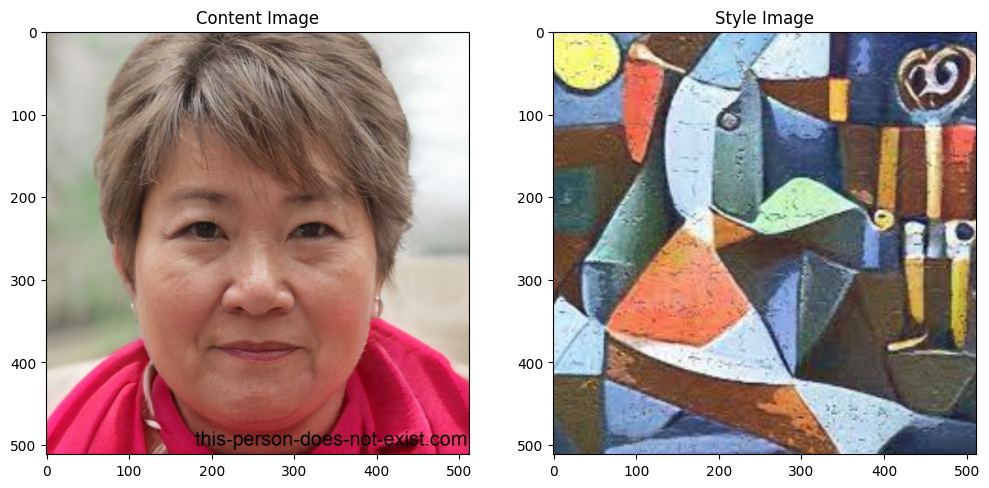

In [ ]:
content_image = load_img(content_path)
style_image = load_img(style_path[0])

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

## Fast Style Transfer using TF-Hub

This tutorial demonstrates the original style-transfer algorithm, which optimizes the image content to a particular style. Before getting into the details, let's see how the [TensorFlow Hub model](https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2) does this:

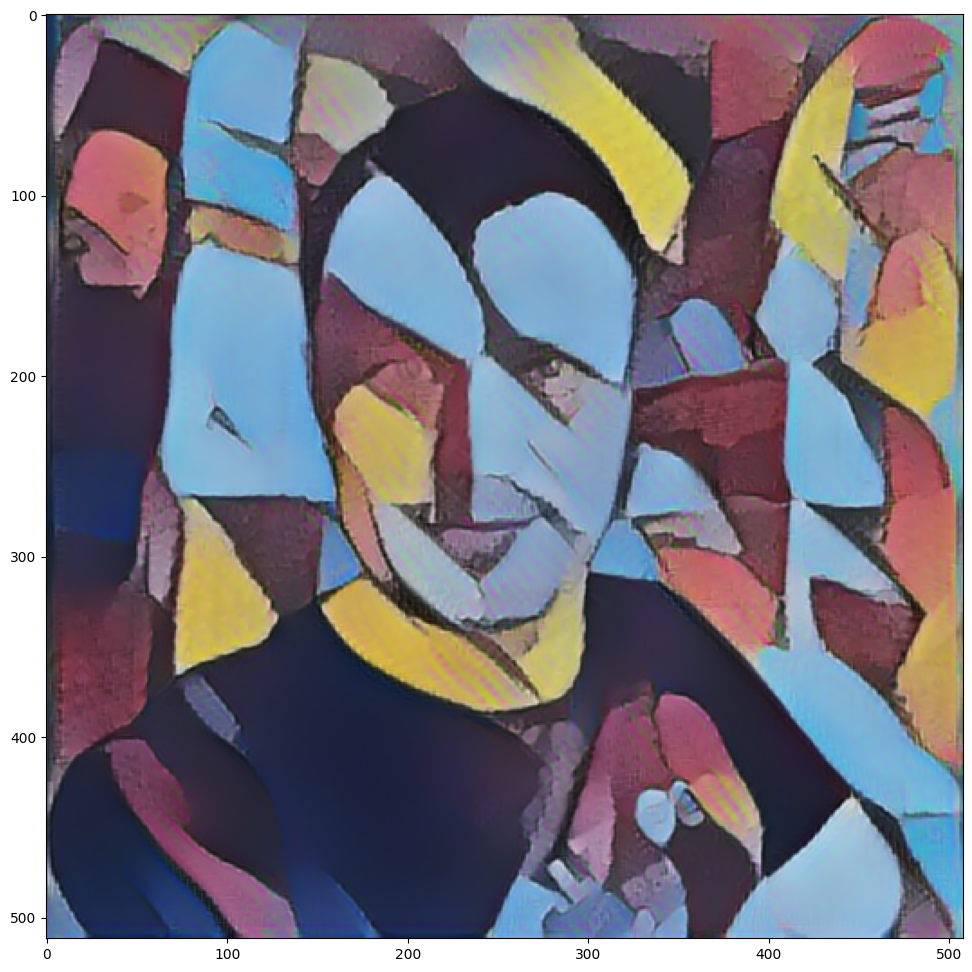

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
style_image = load_img(style_path)
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)
plt.imshow(tensor_to_image(stylized_image))
plt.show()

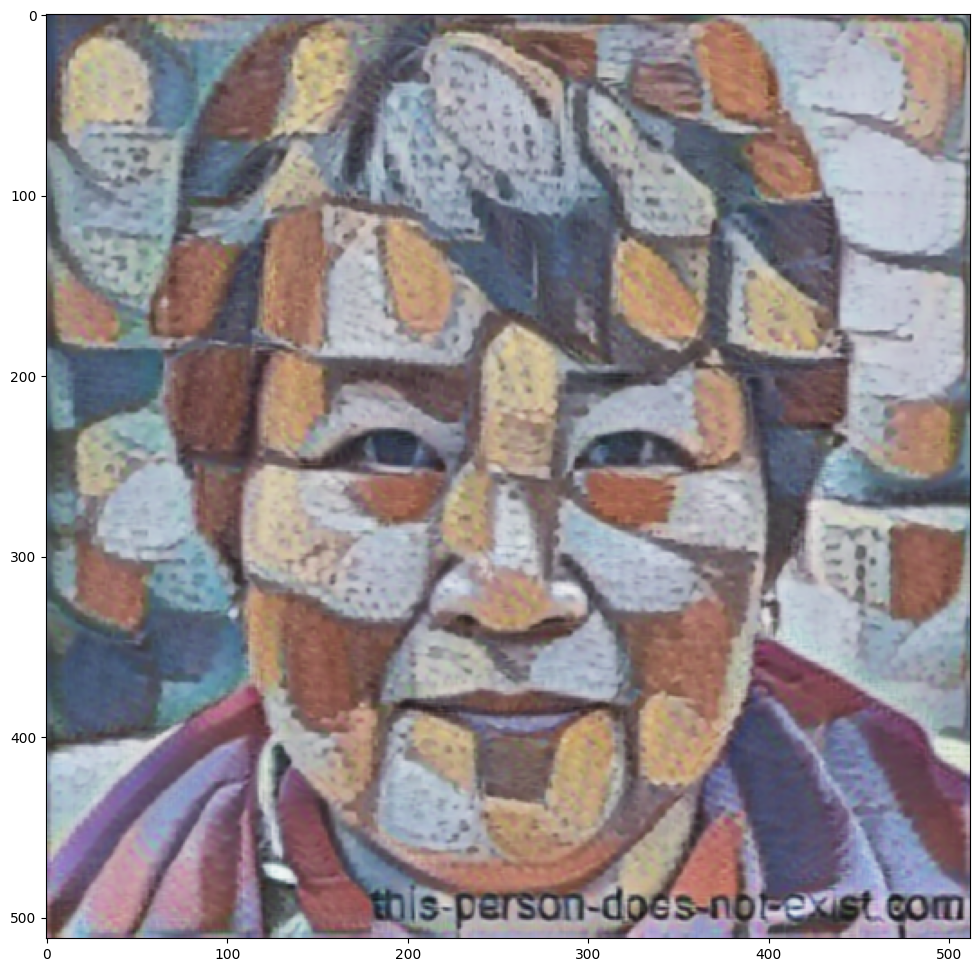

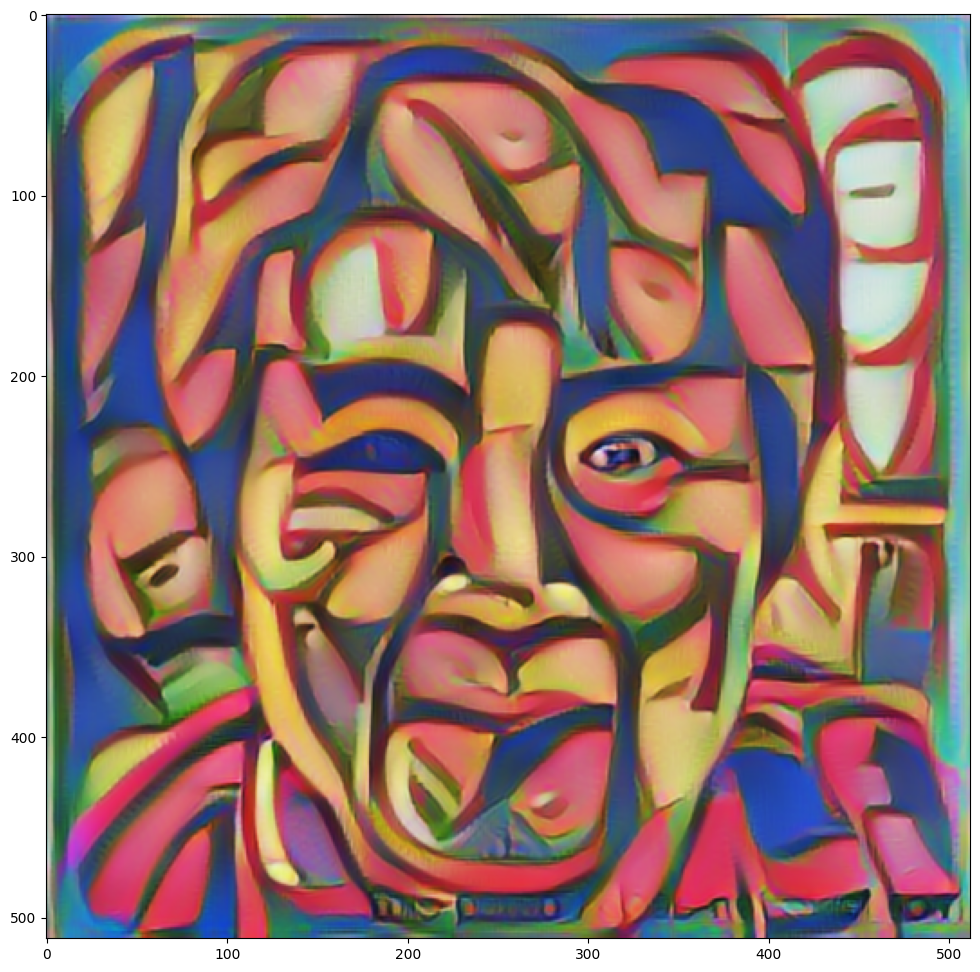

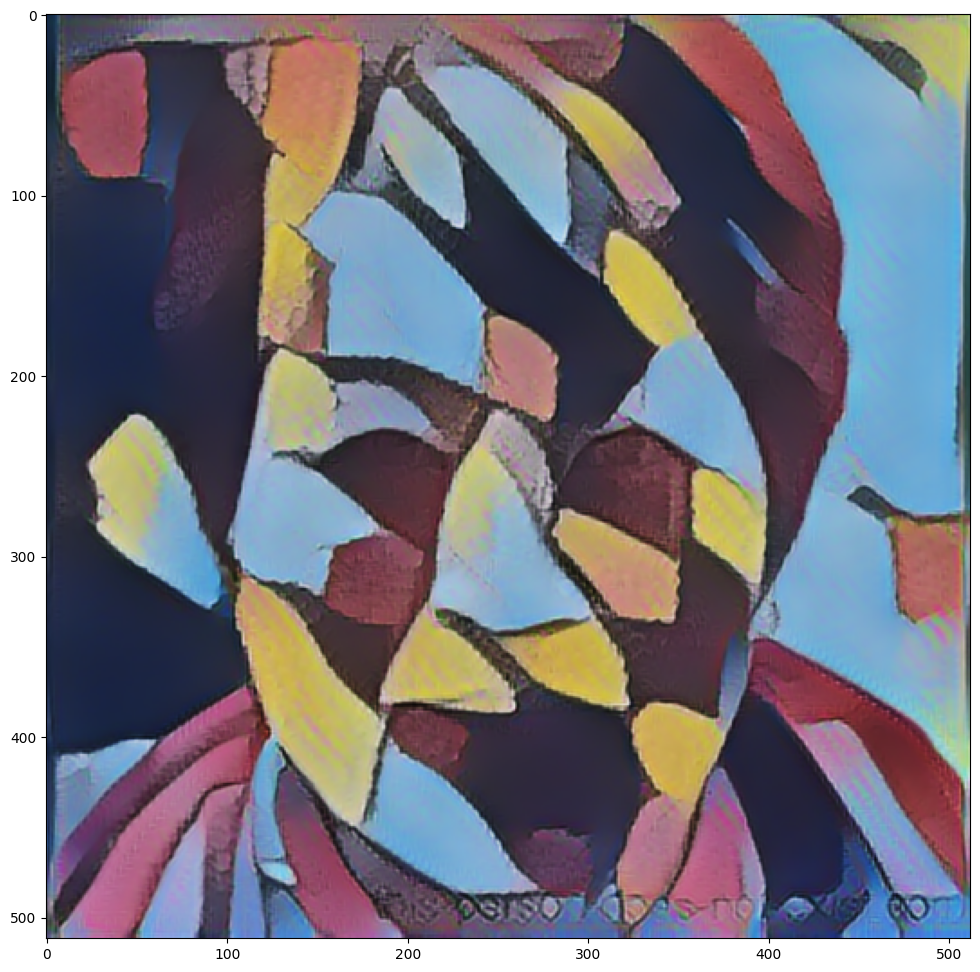

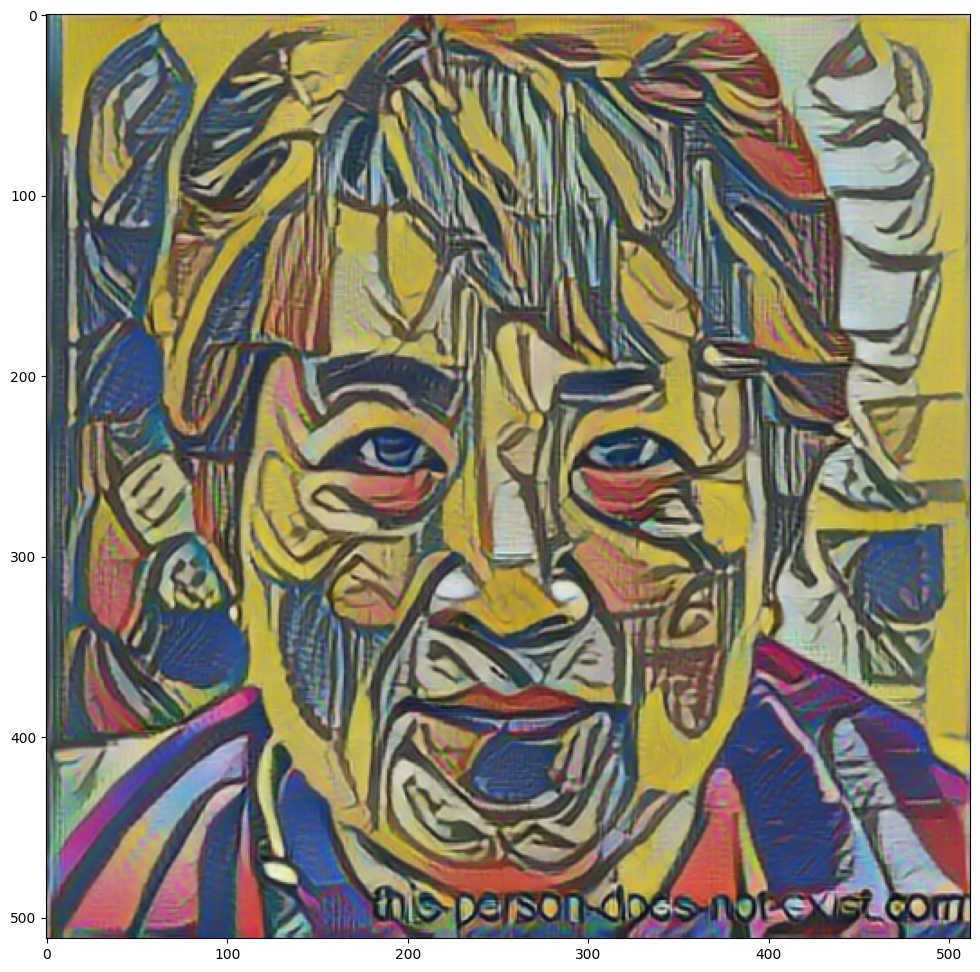

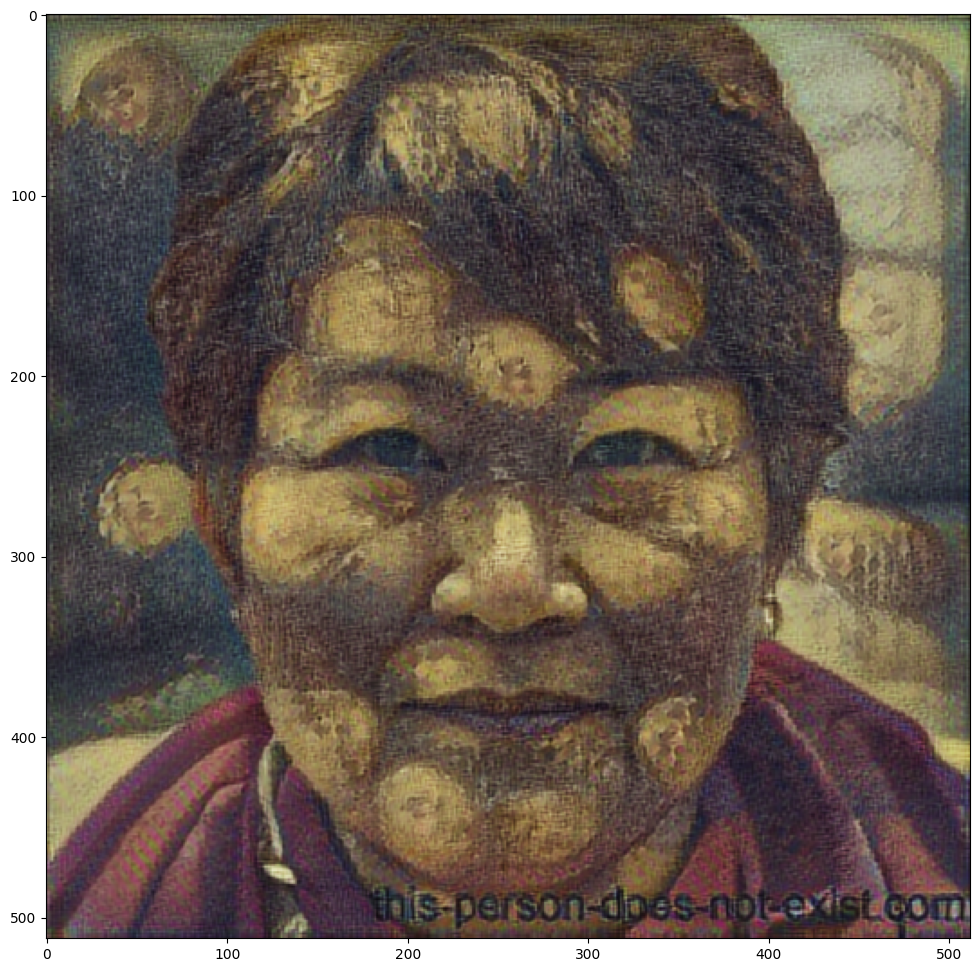

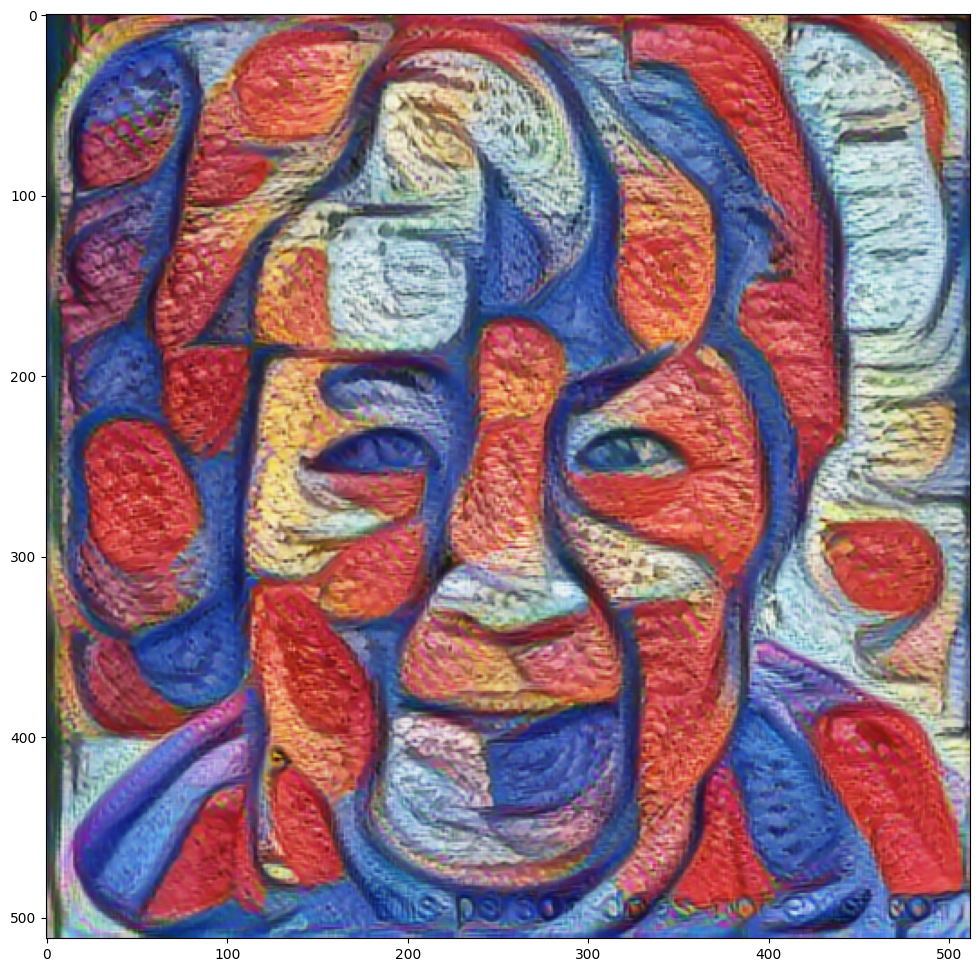

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
for i in range(len(style_path)):
  style_image = load_img(style_path[i])
  stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
  tensor_to_image(stylized_image)
  plt.imshow(tensor_to_image(stylized_image))
  plt.show()